#Введение
В данной работе проверяется гипотеза о целесообразности обучения нейросетевых моделей сегментации на корпусе сейсмических изображений для конкретного участка и использовании этой модели для выделения геологических слоёв (сейсмических фаций) на тестовых изображениях. Оптимальное количество изображений для обучения выявлялось в ходе предшествующих экспериментов с моделями нейронных сетей для выделения геологических слоёв и оно равно 10% от общего количества сейсмических разрезов для всей территории. Данное количество оптимально, потому что позволяет охватить необходимое разнообразие данных. В данной работе эксперименты будут посвящены тестированию различных вариантов архитектур.

Создание обобщённой модели, способной качественно выделять геологические слои на любых сейсмических изображениях, сейчас затруднительно и тому есть несколько причин, главные из которых:

1.   Данные обучения, полученные для отдельных территорий, нельзя обобщать, поскольку для каждой территории уникальны глубинные условия, а для каждых сейсмических работ уникальны внешние условия, в которых они проводятся. А зачастую в распоряжении имеются данные только по одной территории, реже по нескольким. Но даже данные по нескольким территориям можно обобщать лишь для отдельных регионов и не более того.
2.   Обоснованием постановки сейсмических работ почти всегда является перспективность территорий на нефтегазовые ресурсы (здесь не учитывается малоглубинная сейсморазведка, поскольку её результаты для обучения моделей нейронных сетей не будут исчерпывающими). Данная история сопряжена с тем, что материалы подобных работ имеют соответствующий гриф секретности, т.к. они напрямую связаны с обеспечением конкретного государства энергетическими ресурсами. Поэтому данные материалы зачастую не только не находятся в открытом доступе, но и не всегда имеется к ним доступ у специалистов, работающих в сфере сейсморазведки. Связано это с многообразием организаций, обеспечивающих проведение данных работ, и результаты данных работ не разглашают, т.к., по сути, они являются коммерческой тайной.



In [ ]:
import os
import numpy as np
import pandas as pd
from skimage import util, exposure as exp
from skimage.io import imread
from PIL import Image
import pandas as pd
from pathlib import Path
from copy import deepcopy
import random
from time import time
from tqdm.notebook import tqdm, trange

import torch
from torch import nn, optim
from torch.optim import SGD, lr_scheduler
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations import (HorizontalFlip, ShiftScaleRotate, RandomBrightnessContrast,
                            Compose, RandomCrop, CenterCrop, Rotate, Resize, Normalize)
from albumentations.pytorch import ToTensorV2


import math
import seaborn as sns
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
seed = 42
def seed_torch(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed) # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

In [ ]:
!unzip -q /content/gdrive/My\ Drive/Seg_Penobscot/55_55_dataset -d 55_+_55_dataset

#Отбор данных.
Общее количество сейсмических разрезов в кубе данных составляет 1 082. Изначально в данных были обнаружены дефектные маски, поэтому данные изображения и маски не были включены ни в одну из выборок, о которых речь пойдёт далее.

Отбирать данные в выборки будем специфичным образом (не train/test split), поскольку для нас важно охватить определённое разнообразие данных. В нашем случае изображения отбираются по принципу равномерного распределения по сейсмическому кубу данных. Отбирались как инлайны (разрезы по линиям наблюдений, т.е. линиям расстановки сейсмоприёмников) так и кросслайны (разрезы по линиям, параллельным линии возбуждения сейсмических колебаний). Для обучения было отобрано 110 изображений (~10% от общего количества разрезов в кубе данных). На валидацию пошло так же 110 изображений, которые отбирались из экземпляров, находящихся между изображениями обучающей выборки. В тестовую выборку были включены все оставшиеся изображения.

In [ ]:
def get_paths_images(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2
    }

    f = open('/content/55_+_55_dataset/penobscot_train_val_test_split_imgs.txt', 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split(',') for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    images_paths = []
    for filename in lines:
        images_paths.append(os.path.join('/content/55_+_55_dataset/Images/', filename))

    return np.array(images_paths)

def get_paths_masks(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2
    }

    f = open('/content/55_+_55_dataset/penobscot_train_val_test_split_msks.txt', 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split(',') for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    masks_paths = []
    for filename in lines:
        masks_paths.append(os.path.join('/content/55_+_55_dataset/Images/', filename))

    return np.array(masks_paths)

In [ ]:
class PenobscotDataset(Dataset):
    def __init__(self, dataset_type, transform=None):
        self.images = get_paths_images(dataset_type=dataset_type)
        f = open('/content/55_+_55_dataset/penobscot_anno.txt', 'r')
        masks = f.readlines()
        f.close()
        masks = [x.strip().split() for x in masks]
        masks = {x:y for x, y in masks}
        self.masks = [masks[x.split('/')[-1]] for x in self.images]
        self.dataset_type = dataset_type
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_mask = os.path.join('/content/55_+_55_dataset/Images/', self.masks[idx])

        img = np.array(Image.open(img_name).convert('RGB'))
        mask = np.array(Image.open(img_mask).convert('RGB'))

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = aug['image']
            mask = aug['mask']
            mask = torch.max(mask, dim=2)[0]
            msk = F.one_hot(mask.long(), num_classes=8)
            m = np.zeros((8, msk.size(0), msk.size(1)))
            for i in range(8):
                m[i, :, :] = msk[:, :, i]
            label = torch.Tensor(m)

            sample = {
                'image': img,
                'mask': mask,
                'label': label
            }

        return sample

In [ ]:
CL_BM_WEIGHTS = '/content/gdrive/MyDrive/Seg_Penobscot/CL2_best_model_weights'
os.makedirs(CL_BM_WEIGHTS, exist_ok=True)

In [ ]:
transform_1 = A.Compose([
    Resize(1488, 480),
    CenterCrop(1488, 464),
    Resize(448, 144),
    Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ToTensorV2()
])

transform_2 = A.Compose([
    Resize(1488, 480),
    CenterCrop(1488, 464),
    Resize(448, 144),
    Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ToTensorV2()
])

augm = A.Compose([
    Resize(1488, 480),
    CenterCrop(1488, 464),
    Resize(448, 144),
    HorizontalFlip(p=0.5),
    RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
    Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ToTensorV2()
])

In [ ]:
seed_torch(seed)
train_data_55 = PenobscotDataset('train', transform=augm)
val_data_55 = PenobscotDataset('val', transform=transform_1)
test_data_55 = PenobscotDataset('test', transform=transform_2)

batch_size = 10
train_loader_55 = torch.utils.data.DataLoader(train_data_55, batch_size=batch_size, shuffle=True)
val_loader_55 = torch.utils.data.DataLoader(val_data_55, batch_size=batch_size, shuffle=False)
test_loader_55 = torch.utils.data.DataLoader(test_data_55, batch_size=batch_size, shuffle=False)
print(len(train_data_55), len(val_data_55), len(test_data_55), len(train_loader_55), len(val_loader_55), len(test_loader_55))

train_sampler = torch.utils.data.RandomSampler(train_data_55, replacement=True, num_samples=330)
aug_train_loader_55 = torch.utils.data.DataLoader(train_data_55, batch_size=batch_size, sampler=train_sampler, num_workers=2)
print(len(aug_train_loader_55), len(train_sampler), len(aug_train_loader_55.sampler))

110 110 410 11 11 41
33 330 330


<ipython-input-10-e54bbe073bcf>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


Size for images  ------> torch.Size([10, 3, 448, 144])
Size for masks before One Hot Encoding ------> torch.Size([10, 448, 144])
Size for masks after One Hot Encoding ------> torch.Size([10, 8, 448, 144])


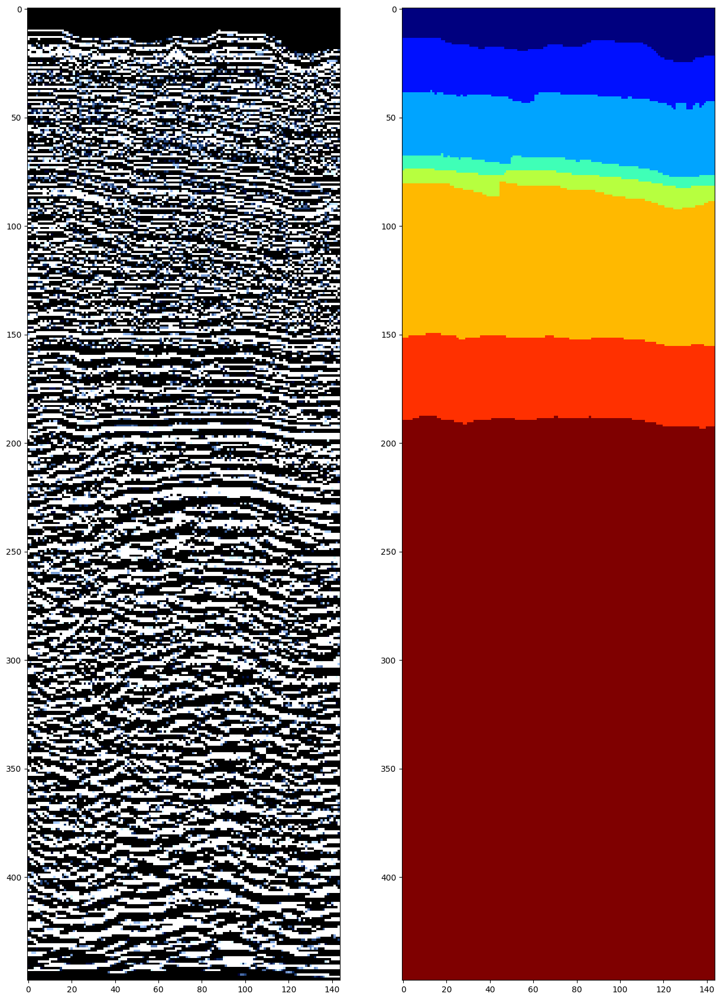

In [ ]:
for i in aug_train_loader_55:
    plt.subplots(figsize=(15, 30))
    plt.subplot(1, 2, 1)
    plt.imshow(i['image'][3].permute(1, 2, 0), cmap='gray')
    plt.subplot(1, 2, 2)
    plt.imshow(i['mask'][3].permute(0, 1), cmap='jet')
    print('Size for images  ------>', i['image'].shape)
    print('Size for masks before One Hot Encoding ------>', i['mask'].shape)
    print('Size for masks after One Hot Encoding ------>', i['label'].shape)
    break

In [ ]:
!pip install torchsummary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Exp #1. Vanilla UNet.

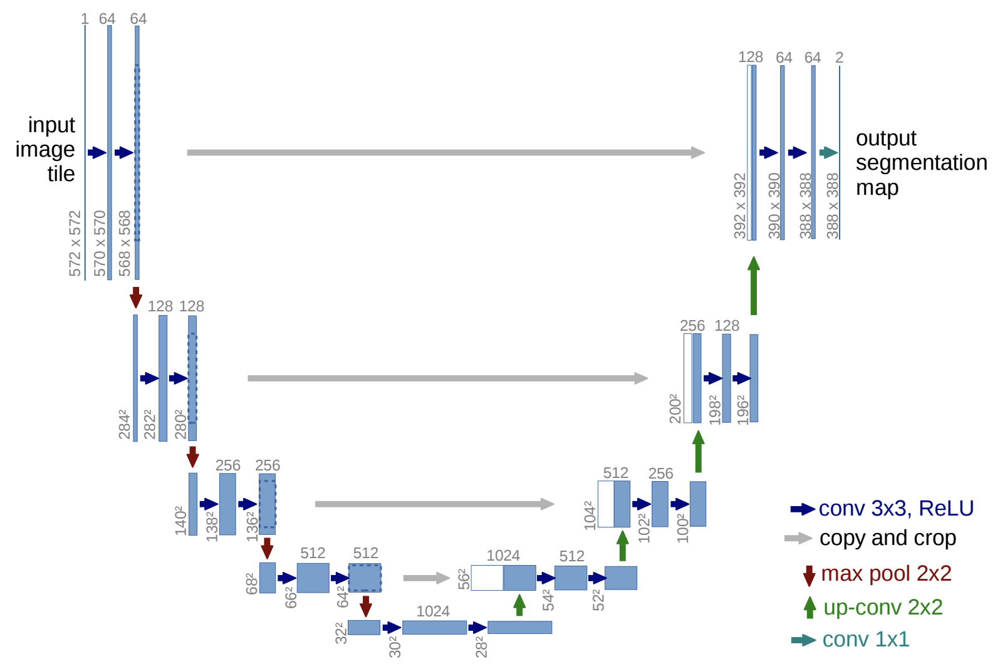

Изначально в качестве архитектуры сети была выбрана хорошо зарекомендовавшая себя на решении таких задач UNet. В данном эксперименте она будет применяться в стандартной комплектации, только свёртки будем активировать с помощью LeakyReLU, дабы не занулялись нейроны при входных данных, имеющих отрицальный знак.

В качестве метрики будем применять mean intersection over union (mIoU), или коэффициент Жаккарда.

В качестве функции потерь будет применять комбинацию Jaccard loss и Binary Cross Entropy. Т.к. мы в качестве целевых масок для обучения будем использовать one-hot-maps, то мы себе можем позволить применение BCE, однако будем применять её в упрощённом виде с логитами, поскольку в таком виде она менее подвержена численной неустойчивости.

In [ ]:
class encoding_block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(encoding_block, self).__init__()
        model = []
        model.append(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.LeakyReLU(inplace=True))
        model.append(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.LeakyReLU(inplace=True))
        model.append(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.LeakyReLU(inplace=True))
        self.conv = nn.Sequential(*model)
    def forward(self, x):
        return self.conv(x)

In [ ]:
class UNet(nn.Module):
    def __init__(self, out_channels=8, features=[64, 128, 256, 512]):
        super(UNet, self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))
        self.conv1 = encoding_block(3, features[0])
        self.conv2 = encoding_block(features[0], features[1])
        self.conv3 = encoding_block(features[1], features[2])
        self.conv4 = encoding_block(features[2], features[3])
        self.conv5 = encoding_block(features[3]*2, features[3])
        self.conv6 = encoding_block(features[3], features[2])
        self.conv7 = encoding_block(features[2], features[1])
        self.conv8 = encoding_block(features[1], features[0])
        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)
        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)
        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)
        self.tconv4 = nn.ConvTranspose2d(features[-3], features[-4], kernel_size=2, stride=2)
        self.bottleneck = encoding_block(features[3], features[3]*2)
        self.final_layer = nn.Conv2d(features[0], out_channels, kernel_size=1)
        # self.active = nn.Softmax(dim=1)

    def forward(self, x):
        skip_connections = []
        x = self.conv1(x)
        skip_connections.append(x)
        x = self.pool(x)   # 224 x 72
        x = self.conv2(x)
        skip_connections.append(x)
        x = self.pool(x)   # 112 x 36
        x = self.conv3(x)
        skip_connections.append(x)
        x = self.pool(x)   # 56 x 18
        x = self.conv4(x)
        skip_connections.append(x)
        x = self.pool(x)   # 28 x 9
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        x = self.tconv1(x)   # 56 x 18
        x = torch.cat((skip_connections[0], x), dim=1)
        x = self.conv5(x)
        x = self.tconv2(x)   # 112 x 36
        x = torch.cat((skip_connections[1], x), dim=1)
        x = self.conv6(x)
        x = self.tconv3(x)   # 224 x 72
        x = torch.cat((skip_connections[2], x), dim=1)
        x = self.conv7(x)
        x = self.tconv4(x)   # 448 x 144
        x = torch.cat((skip_connections[3], x), dim=1)
        x = self.conv8(x)
        x = self.final_layer(x)
        # x = self.active(out)
        return x

In [ ]:
def show_some_samples(model, loader):

     for batch in loader:
         x = batch['image'].to(DEVICE)
         y = batch['mask']
         fig, ax = plt.subplots(3, 3, figsize=(18, 18))
         softmax = nn.Softmax(dim=1)
         preds = torch.argmax(softmax(model(x)), axis=1).to('cpu')

         img1 = np.transpose(np.array(x[0, :, :, :].to('cpu')), (1, 2, 0))
         preds1 = np.array(preds[0, :, :])
         mask1 = np.array(y[0, :, :])

         img2 = np.transpose(np.array(x[1, :, :, :].to('cpu')), (1, 2, 0))
         preds2 = np.array(preds[1, :, :])
         mask2 = np.array(y[1, :, :])

         img3 = np.transpose(np.array(x[2, :, :, :].to('cpu')), (1, 2, 0))
         preds3 = np.array(preds[2, :, :])
         mask3 = np.array(y[2, :, :])

         ax[0,0].set_title('Image')
         ax[0,1].set_title('Mask')
         ax[0,2].set_title('Prediction')

         ax[1,0].set_title('Image')
         ax[1,1].set_title('Mask')
         ax[1,2].set_title('Prediction')

         ax[2,0].set_title('Image')
         ax[2,1].set_title('Mask')
         ax[2,2].set_title('Prediction')

         ax[0][0].axis("off")
         ax[1][0].axis("off")
         ax[2][0].axis("off")
         ax[0][1].axis("off")
         ax[1][1].axis("off")
         ax[2][1].axis("off")
         ax[0][2].axis("off")
         ax[1][2].axis("off")
         ax[2][2].axis("off")

         ax[0][0].imshow(img1, cmap='gray')
         ax[0][1].imshow(mask1, cmap='jet')
         ax[0][2].imshow(preds1, cmap='jet')

         ax[1][0].imshow(img2, cmap='gray')
         ax[1][1].imshow(mask2, cmap='jet')
         ax[1][2].imshow(preds2, cmap='jet')

         ax[2][0].imshow(img3, cmap='gray')
         ax[2][1].imshow(mask3, cmap='jet')
         ax[2][2].imshow(preds3, cmap='jet')

         break

In [ ]:
def mIoU(y_pred, y_true, smooth=1e-10, n_classes=8):
    with torch.no_grad():
        y_pred = F.softmax(y_pred, dim=1)
        y_pred = torch.argmax(y_pred, dim=1)
        y_pred = y_pred.contiguous().view(-1)
        y_true = y_true.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = y_pred == clas
            true_label = y_true == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)

        return np.nanmean(iou_per_class)

def jaccard_loss(inputs, targets, smooth=1e-8):

        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.softmax(inputs, dim=1)
        #inputs = torch.argmax(inputs, axis=1)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection

        IoU = (intersection + smooth)/(union + smooth)

        return 1. - torch.mean(IoU)

def comb_loss(y_pred, y_true):
    return 0.8 * jaccard_loss(y_pred, y_true) + 0.2 * ((y_pred - y_true * y_pred + (1 + torch.exp(-y_pred)).log()).mean())

In [ ]:
def train(model, train_loader, val_loader, optimizer, scheduler, epochs, weights):
    since = time()

    train_losses = []
    val_losses = []
    train_scores = []
    val_scores = []
    train_accuracy = []
    val_accuracy = []
    best_score = 0.0
    best_model_weights = deepcopy(model.state_dict())

    pbar = trange(epochs, desc='Epoch:')
    for epoch in pbar:
        print('---------- Epoch %d/%d ----------' % (epoch+1, epochs))
        # Train
        tr_loss = 0
        tr_score = 0
        tr_acc = 0
        model.train()
        for batch in tqdm(train_loader):
            X_batch, masks, Y_batch = batch['image'].to(DEVICE), batch['mask'].to(DEVICE), batch['label'].to(DEVICE)
            # Forward
            logits = model(X_batch)
            loss = comb_loss(logits.to(DEVICE), Y_batch)
            # Backward
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            tr_loss += loss.item()
            tr_score += mIoU(logits, masks)

        train_loss = tr_loss / len(train_loader)
        train_losses.append(train_loss)
        train_score = tr_score / len(train_loader)
        train_scores.append(train_score)
        print('Train loss =', train_loss)
        print('Train mIoU = {:.4f}'.format(train_score.item()))

        # Validation
        model.eval()
        v_loss = 0
        v_score = 0
        v_acc = 0
        with torch.no_grad():
            for batch in tqdm(val_loader):
                X_val, masks, Y_val = batch['image'].to(DEVICE), batch['mask'].to(DEVICE), batch['label'].to(DEVICE)
                logits = model(X_val)
                loss = comb_loss(logits.to(DEVICE), Y_val)

                v_loss += loss.item()
                v_score += mIoU(logits, masks)

        val_loss = v_loss / len(val_loader)
        val_losses.append(val_loss)
        val_score = v_score / len(val_loader)
        val_scores.append(val_score)
        print('Val loss =', val_loss)
        print('Val mIoU = {:.4f}'.format(val_score.item()))

        if val_score > best_score:
            best_score = val_score
            torch.save(model.state_dict(), os.path.join(weights, 'Best_model_' + str(epoch+1) + '.pth'))
            best_model_weights = deepcopy(model.state_dict())
            print('Save best model!')

        scheduler.step()
        print(f'Time: {(time() - since)}')
        if (epoch + 1) % 5 == 0 and (epoch + 1) != epochs:
            clear_output(wait=True)

    show_some_samples(model, val_loader)

    plt.subplots(figsize=(23, 9))
    plt.subplot(1, 2, 1)
    plt.plot(np.arange(1, len(train_losses) + 1), train_losses, label='train loss')
    plt.plot(np.arange(1, len(val_losses) + 1), val_losses, label='val loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    best_ep = np.argmin(val_losses) + 1
    plt.axvline(best_ep, color='r', label="best epoch")
    plt.legend(loc='upper right')
    plt.title('Losses')

    plt.subplot(1, 2, 2)
    plt.plot(np.arange(1, len(train_scores) + 1), train_scores, label='train mIoU')
    plt.plot(np.arange(1, len(val_scores) + 1), val_scores, label='val mIoU')
    best_ep = np.argmax(val_scores) + 1
    plt.axvline(best_ep, color='r', label="best epoch")
    plt.xlabel('Epoch')
    plt.ylabel('mIoU')
    plt.legend(loc='upper right')
    plt.title('Scores')

    plt.show()

    t = time() - since

    return best_model_weights, train_losses, val_losses, train_scores, val_scores, t

In [ ]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
torch.cuda.empty_cache()
!nvidia-smi

cuda
Thu Jun 15 02:20:08 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    12W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+--

In [ ]:
model_CL = UNet().to(DEVICE)
torch.cuda.empty_cache()
from torchsummary import summary
summary(model_CL, (3, 448, 144))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 448, 144]           1,728
       BatchNorm2d-2         [-1, 64, 448, 144]             128
         LeakyReLU-3         [-1, 64, 448, 144]               0
            Conv2d-4         [-1, 64, 448, 144]          36,864
       BatchNorm2d-5         [-1, 64, 448, 144]             128
         LeakyReLU-6         [-1, 64, 448, 144]               0
            Conv2d-7         [-1, 64, 448, 144]          36,864
       BatchNorm2d-8         [-1, 64, 448, 144]             128
         LeakyReLU-9         [-1, 64, 448, 144]               0
   encoding_block-10         [-1, 64, 448, 144]               0
        MaxPool2d-11          [-1, 64, 224, 72]               0
           Conv2d-12         [-1, 128, 224, 72]          73,728
      BatchNorm2d-13         [-1, 128, 224, 72]             256
        LeakyReLU-14         [-1, 128, 

In [ ]:
seed_torch(seed)
optimizer = optim.AdamW(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
epochs = 1
losses = []
score = []
pbar = trange(epochs, desc='Epoch:')
for epoch in pbar:
    l = 0.0
    s = 0.0
    model_CL.train()
    for batch in aug_train_loader_55:
        X_batch, masks, Y_batch = batch['image'].to(DEVICE), batch['mask'].to(DEVICE), batch['label'].to(DEVICE)
        logits = model_CL(X_batch)
        loss = comb_loss(logits.to(DEVICE), Y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        l += loss
        s += mIoU(logits, masks)
    optimizer.step()
    loss = l / len(aug_train_loader_55)
    losses.append(loss)
    sc = s / len(aug_train_loader_55)
    score.append(sc)
print(l, loss, losses, score)

Epoch::   0%|          | 0/1 [00:00<?, ?it/s]

tensor(23.3356, device='cuda:0', grad_fn=<AddBackward0>) tensor(0.7071, device='cuda:0', grad_fn=<DivBackward0>) [tensor(0.7071, device='cuda:0', grad_fn=<DivBackward0>)] [0.2676593665219736]


Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.561380740368005
Train mIoU = 0.4432


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.542178517038172
Val mIoU = 0.4465
Save best model!
Time: 41.14223384857178
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.5303646633119294
Train mIoU = 0.4333


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.5023449090394106
Val mIoU = 0.4484
Save best model!
Time: 88.34038281440735
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.49323927091829706
Train mIoU = 0.4459


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.4728061719374223
Val mIoU = 0.4491
Save best model!
Time: 130.18749928474426
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.4742498343641108
Train mIoU = 0.4409


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.45984888076782227
Val mIoU = 0.4497
Save best model!
Time: 173.62052702903748
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.4607781126643672
Train mIoU = 0.4411


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.44960057735443115
Val mIoU = 0.4484
Time: 210.25865292549133


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


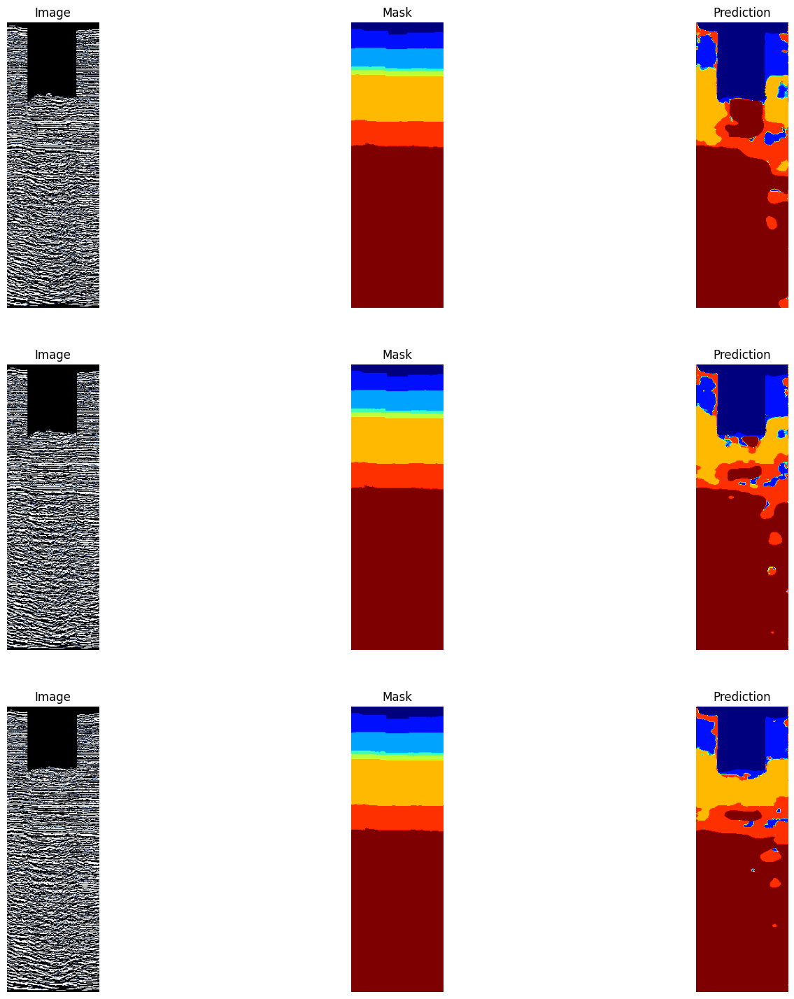

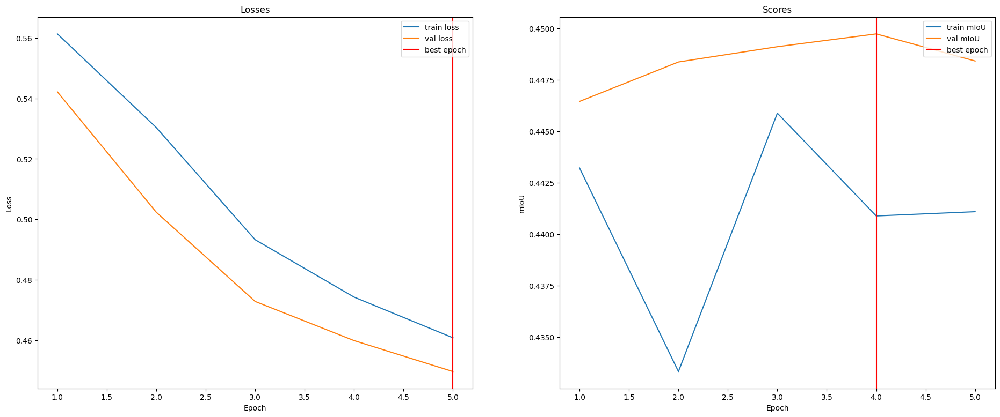

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.SGD(model_CL.parameters(), lr=3e-4, momentum=0.9, nesterov=True)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)
times = []

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.39291678775440564
Train mIoU = 0.5301


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.36396529186855664
Val mIoU = 0.6524
Save best model!
Time: 37.904173612594604
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.273653274232691
Train mIoU = 0.6685


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.23493348332968625
Val mIoU = 0.7295
Save best model!
Time: 78.96353912353516
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.23177721148187463
Train mIoU = 0.6911


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.6805719137191772
Val mIoU = 0.1331
Time: 120.09836030006409
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.23508199959090262
Train mIoU = 0.5825


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.22295066172426398
Val mIoU = 0.6387
Time: 157.24154591560364
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.16510529093670123
Train mIoU = 0.6881


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.29104621572927997
Val mIoU = 0.5098
Time: 193.83180236816406


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


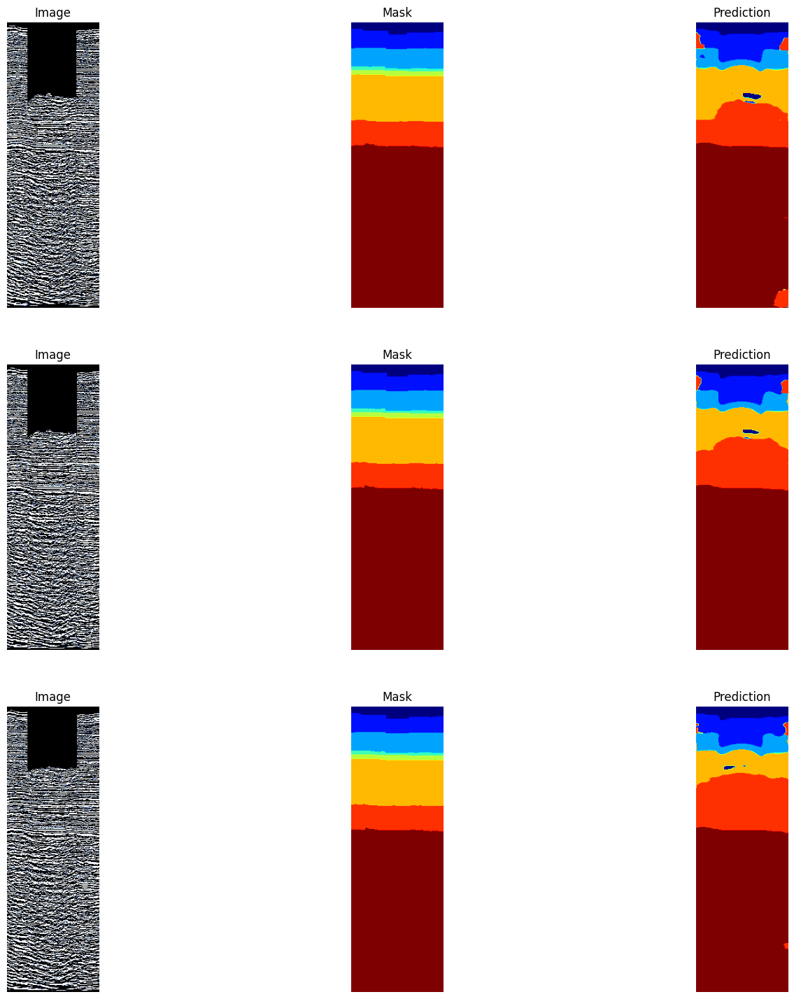

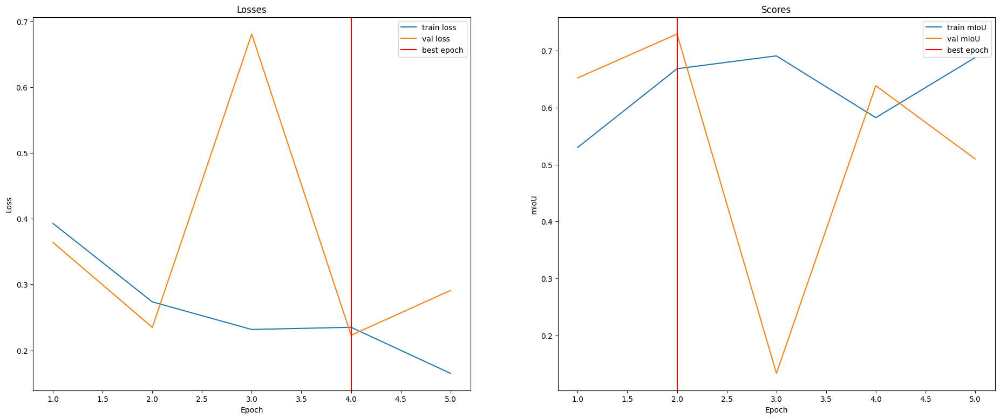

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.AdamW(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.14841995772087213
Train mIoU = 0.7149


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.12228957292708484
Val mIoU = 0.7597
Save best model!
Time: 38.609009742736816
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.10025694876006155
Train mIoU = 0.7832


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.08914589136838913
Val mIoU = 0.8002
Save best model!
Time: 76.10767865180969
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.07879054952751506
Train mIoU = 0.8235


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.0763538195328279
Val mIoU = 0.8783
Save best model!
Time: 113.7825927734375
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.06610075395667192
Train mIoU = 0.9309


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.0641610138118267
Val mIoU = 0.9362
Save best model!
Time: 151.24239253997803
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.05417772540540406
Train mIoU = 0.9587


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.05091040547598492
Val mIoU = 0.9594
Save best model!
Time: 190.46232914924622


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


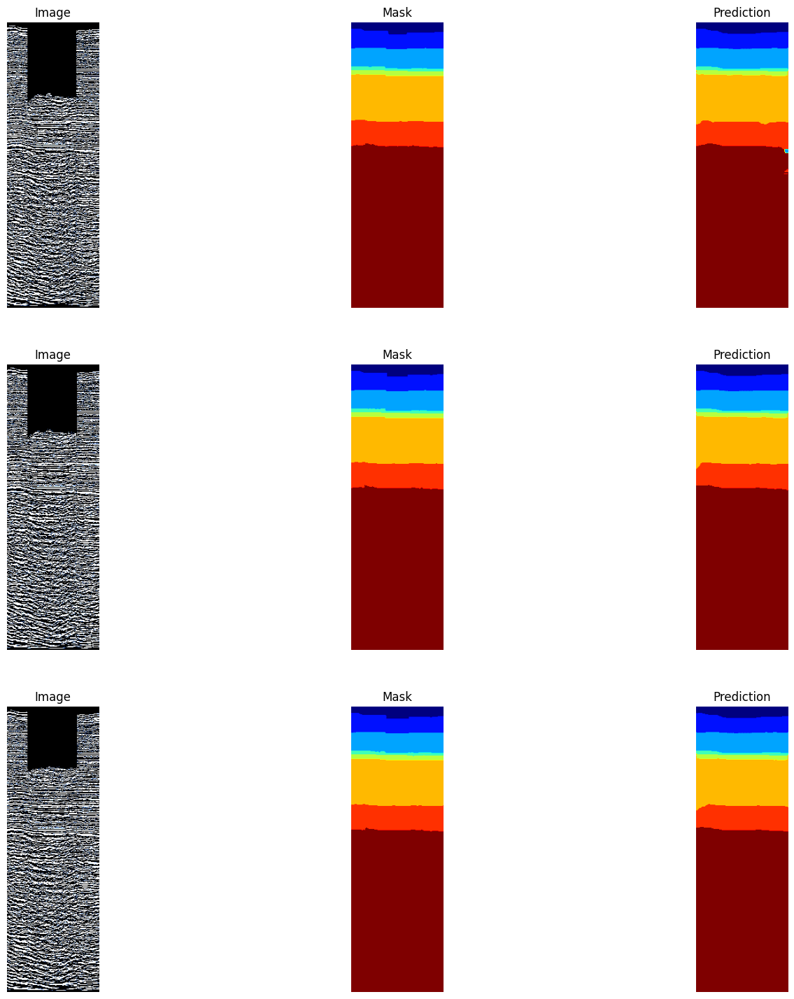

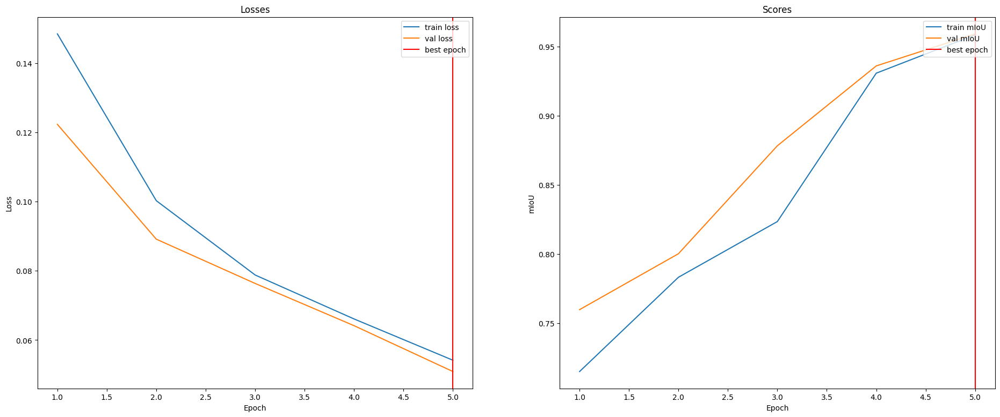

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.Adam(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.049192516866958504
Train mIoU = 0.9633


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.04912798885594715
Val mIoU = 0.9629
Save best model!
Time: 37.46470832824707
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.048476812062841476
Train mIoU = 0.9646


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.04837938431989063
Val mIoU = 0.9637
Save best model!
Time: 74.91216158866882
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.04753423154805646
Train mIoU = 0.9656


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.04772328314456073
Val mIoU = 0.9640
Save best model!
Time: 111.6054515838623
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.04711075228723613
Train mIoU = 0.9661


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.04737715118310668
Val mIoU = 0.9640
Save best model!
Time: 148.63933444023132
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.046680944096861465
Train mIoU = 0.9660


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.047048556533726776
Val mIoU = 0.9642
Save best model!
Time: 185.53644227981567


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


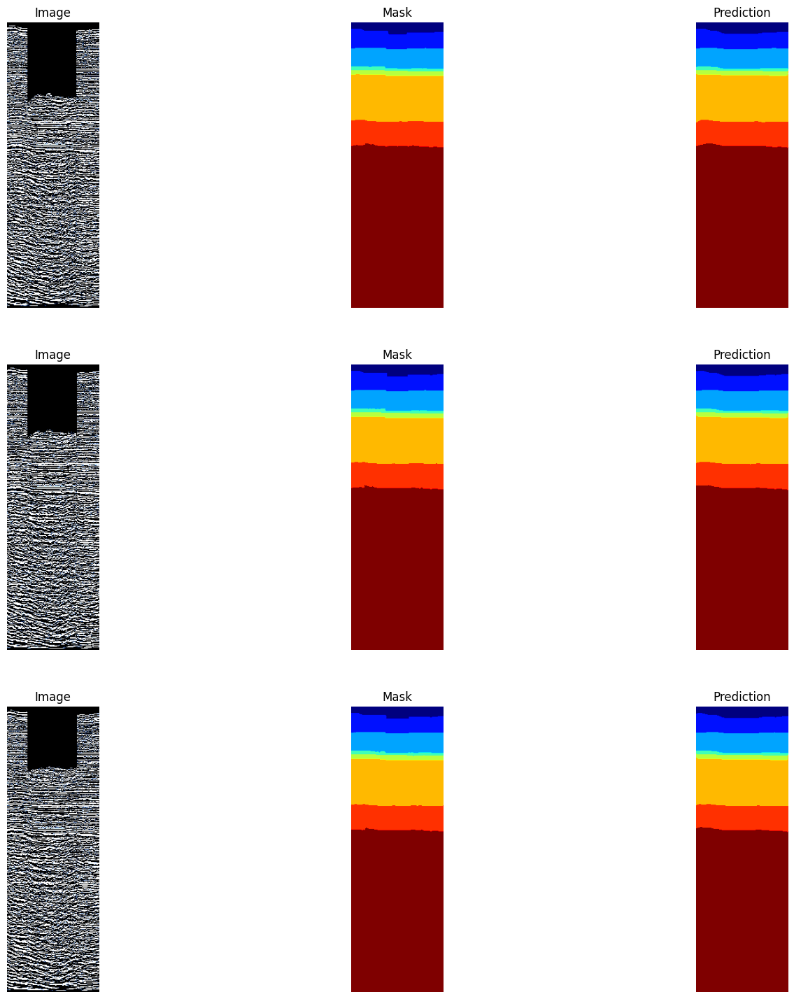

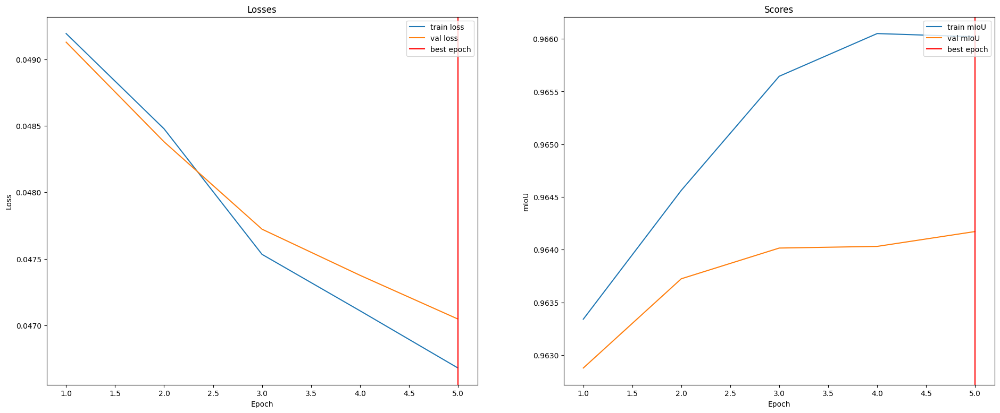

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.SGD(model_CL.parameters(), lr=3e-4, momentum=0.9, nesterov=True)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.047600423070517456
Train mIoU = 0.9449


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.03501226617531343
Val mIoU = 0.9646
Save best model!
Time: 37.92866134643555
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.06476021772532752
Train mIoU = 0.8881


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.03237025913867084
Val mIoU = 0.9604
Time: 74.81071138381958
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.02592229792340235
Train mIoU = 0.9676


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.025584334168921818
Val mIoU = 0.9661
Save best model!
Time: 111.64337277412415
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.02176769422084996
Train mIoU = 0.9721


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.021343605254184116
Val mIoU = 0.9705
Save best model!
Time: 149.19041895866394
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.019722273855498344
Train mIoU = 0.9732


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.019415804100307552
Val mIoU = 0.9721
Save best model!
Time: 186.62495303153992


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


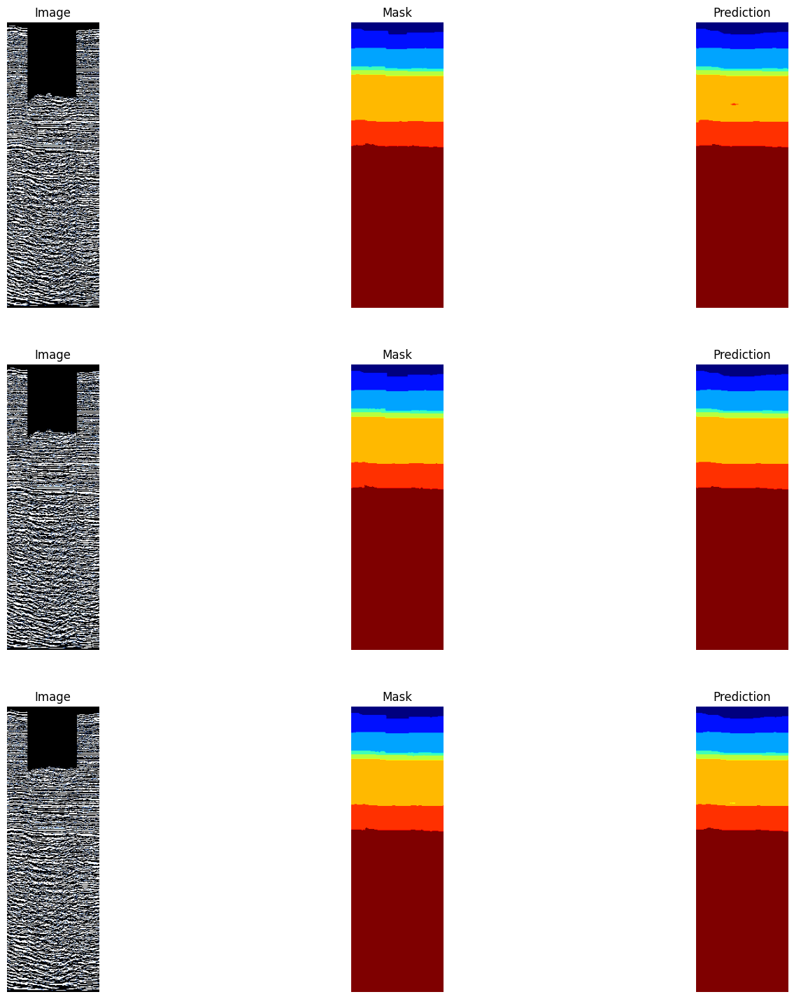

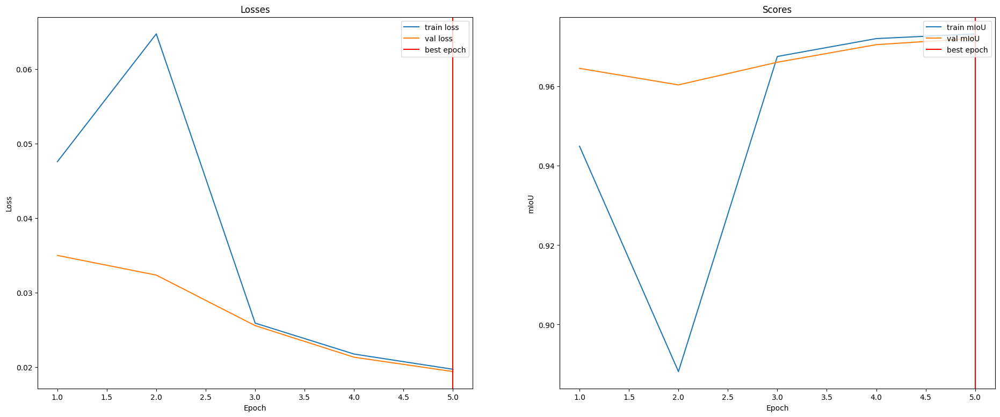

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.AdamW(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)


CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.020957807135401352
Train mIoU = 0.9632


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.016930271278728138
Val mIoU = 0.9701
Save best model!
Time: 39.47719478607178
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.06217973385796403
Train mIoU = 0.8573


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.03372143615375866
Val mIoU = 0.9288
Time: 76.3488278388977
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.025906436794409245
Train mIoU = 0.9482


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.04316502436995506
Val mIoU = 0.9149
Time: 112.95167922973633
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.01491608140482144
Train mIoU = 0.9676


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.015431898307393898
Val mIoU = 0.9648
Time: 149.19944167137146
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.012591043120306549
Train mIoU = 0.9716


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012650222432884302
Val mIoU = 0.9708
Save best model!
Time: 186.7237753868103


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


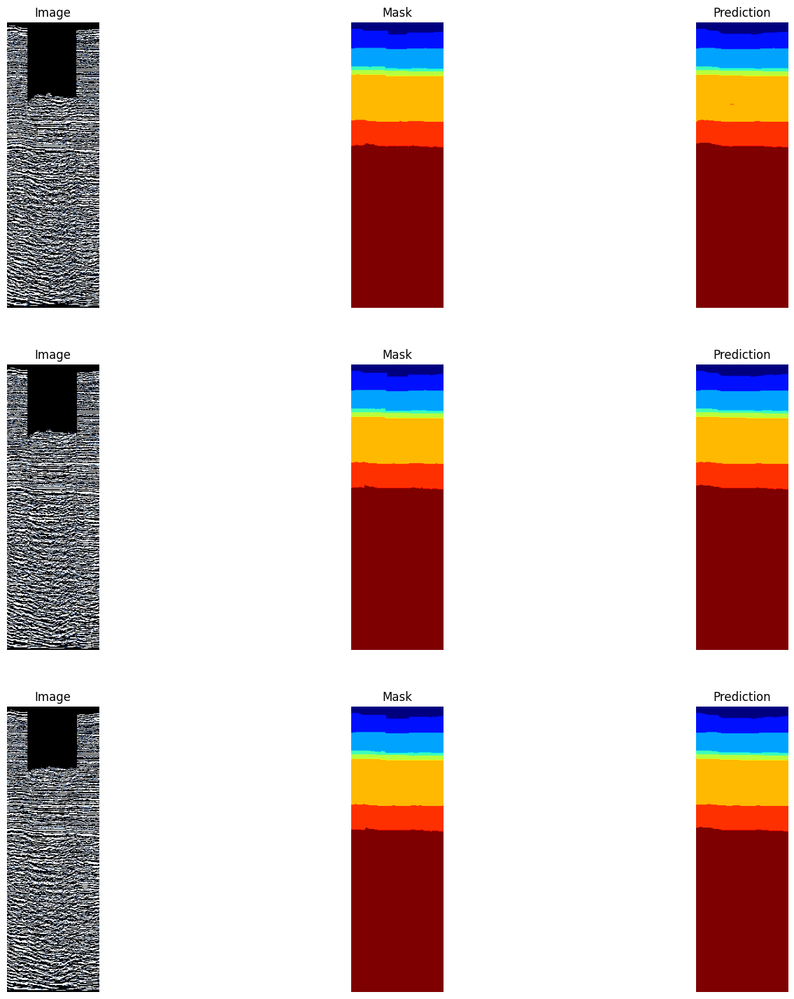

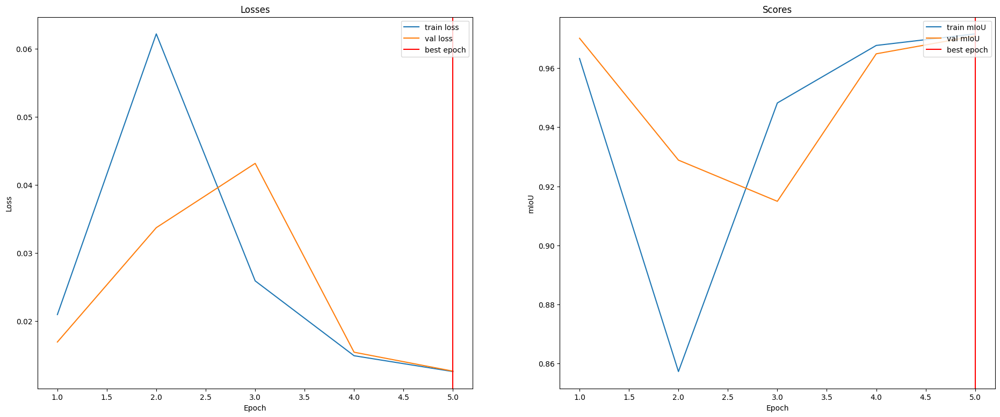

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.Adam(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.01189752391567736
Train mIoU = 0.9728


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012477186677808111
Val mIoU = 0.9709
Save best model!
Time: 37.542006492614746
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.012034373894108065
Train mIoU = 0.9726


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012477646666494284
Val mIoU = 0.9709
Time: 74.19703936576843
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.011877630329267546
Train mIoU = 0.9730


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012445540675385431
Val mIoU = 0.9710
Save best model!
Time: 115.13470363616943
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.011869540720274954
Train mIoU = 0.9733


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012434878132560036
Val mIoU = 0.9711
Save best model!
Time: 153.6653232574463
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.011853351285963348
Train mIoU = 0.9731


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.012434689074077389
Val mIoU = 0.9710
Time: 190.16001272201538


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


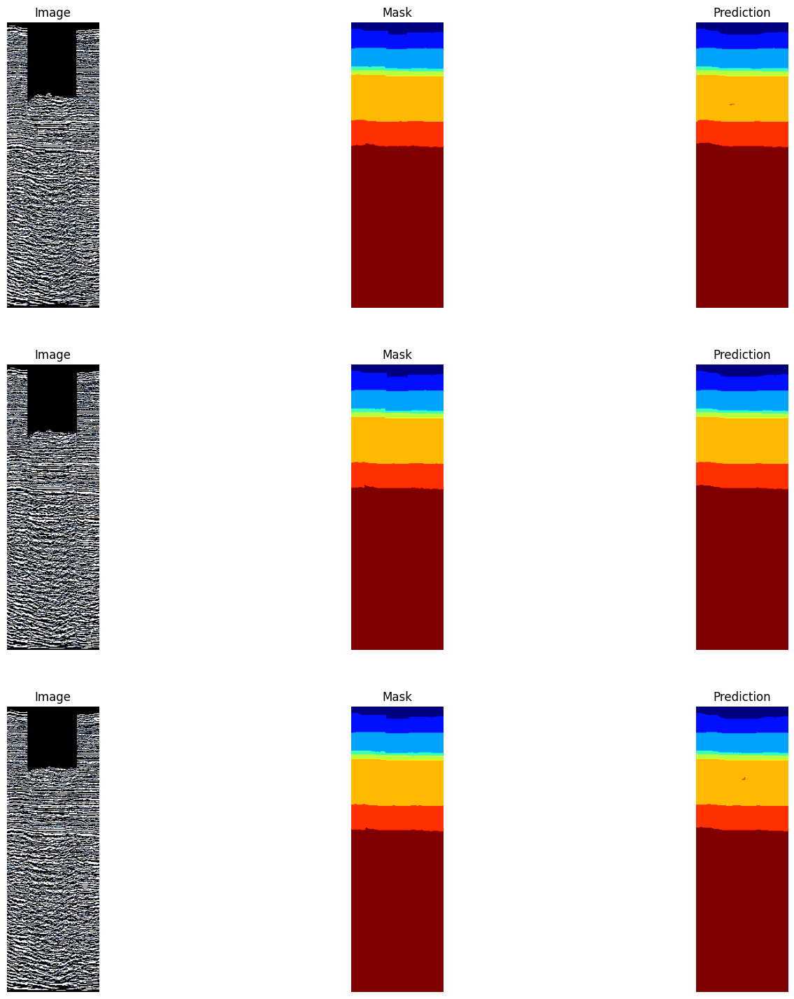

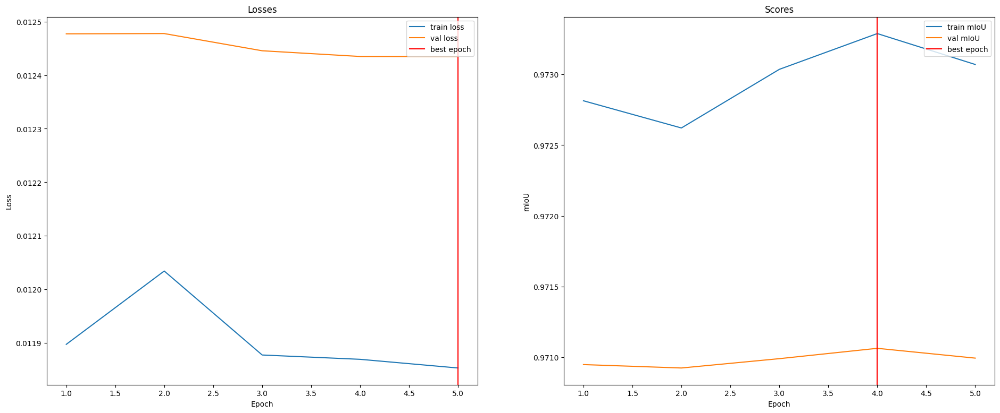

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.SGD(model_CL.parameters(), lr=3e-4, momentum=0.9, nesterov=True)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

Epoch::   0%|          | 0/5 [00:00<?, ?it/s]

---------- Epoch 1/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.01443923061544245
Train mIoU = 0.9648


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.01069480934264985
Val mIoU = 0.9730
Save best model!
Time: 38.08259415626526
---------- Epoch 2/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.01827339884458166
Train mIoU = 0.9581


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.010487239130518654
Val mIoU = 0.9712
Time: 74.39955997467041
---------- Epoch 3/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.009171860885213722
Train mIoU = 0.9746


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.009142132475972176
Val mIoU = 0.9740
Save best model!
Time: 113.9562406539917
---------- Epoch 4/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.010622182225977833
Train mIoU = 0.9733


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.010453120635991747
Val mIoU = 0.9691
Time: 151.8559811115265
---------- Epoch 5/5 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0078091380807260675
Train mIoU = 0.9776


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.00808242064985362
Val mIoU = 0.9764
Save best model!
Time: 189.34447836875916


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


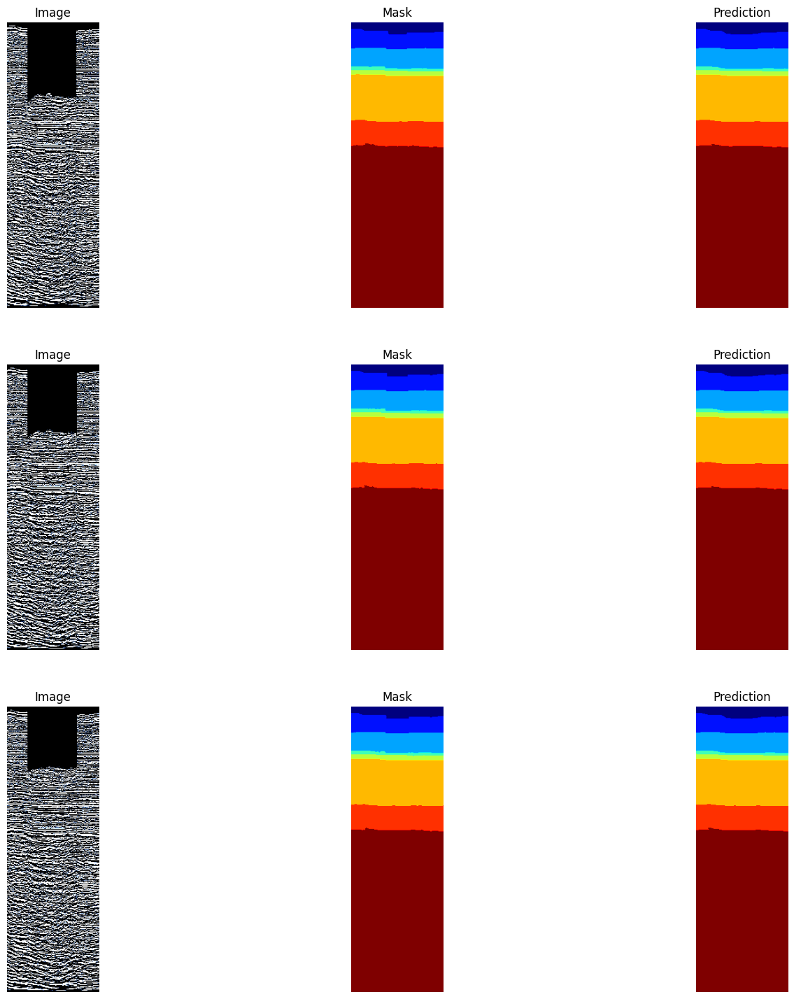

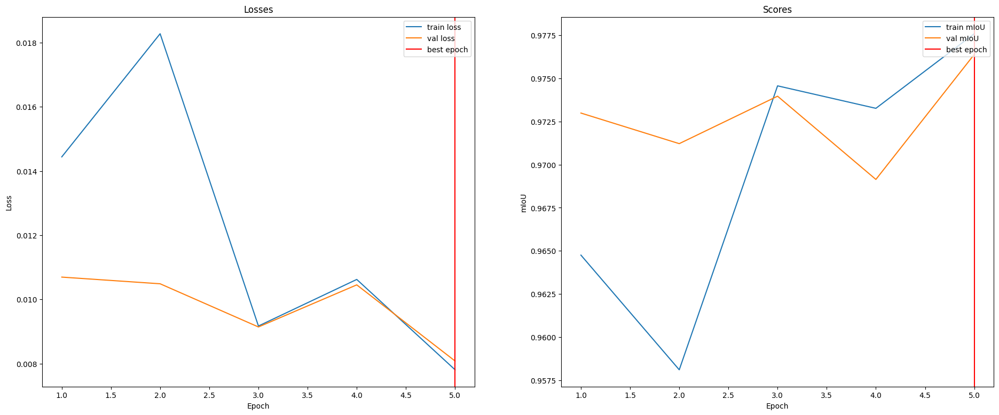

In [ ]:
epochs = 5
seed_torch(seed)
optimizer = optim.AdamW(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

---------- Epoch 16/20 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.00595816523965561
Train mIoU = 0.9812


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.006463856944306331
Val mIoU = 0.9787
Time: 636.692492723465
---------- Epoch 17/20 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.00583401813425801
Train mIoU = 0.9819


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.006460405886173248
Val mIoU = 0.9788
Save best model!
Time: 679.6518542766571
---------- Epoch 18/20 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0057967409604426584
Train mIoU = 0.9816


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.00644330849701708
Val mIoU = 0.9788
Time: 716.564436674118
---------- Epoch 19/20 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.005822251437965668
Train mIoU = 0.9817


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.006422041661360047
Val mIoU = 0.9789
Save best model!
Time: 755.5662999153137
---------- Epoch 20/20 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0059595892883159895
Train mIoU = 0.9811


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.0064151928421448574
Val mIoU = 0.9788
Time: 794.5067489147186


<ipython-input-21-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


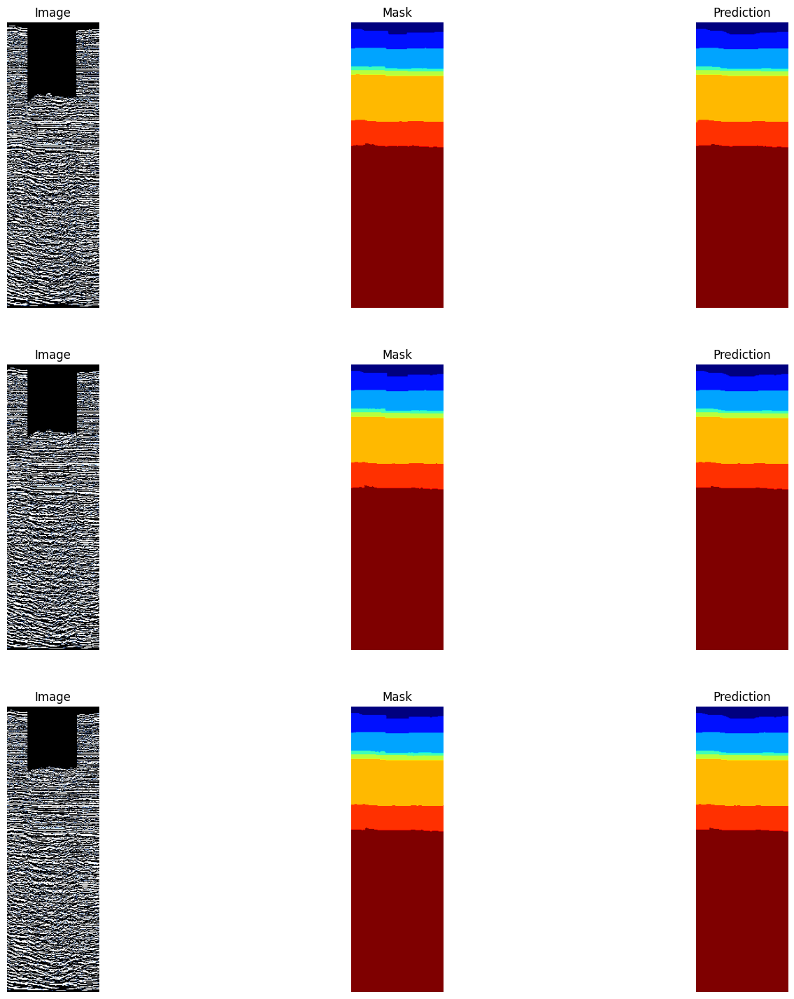

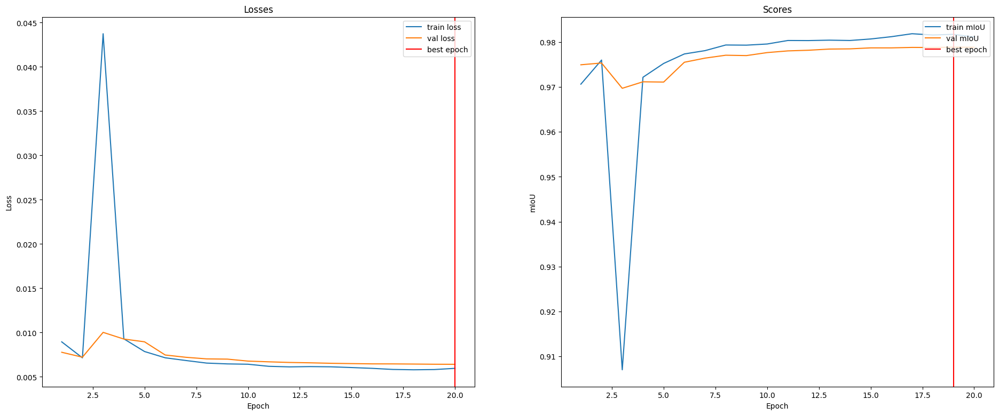

In [ ]:
epochs = 20
seed_torch(seed)
optimizer = optim.Adam(model_CL.parameters(), lr=3e-4, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_1 = train(
    model_CL, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, CL_BM_WEIGHTS
)
times.append(time_1)

In [ ]:
time_1 = sum(times)

In [ ]:
def evaluate(model, dataloader):
    losses = 0
    metric = 0
    images = []
    masks = []
    predictions = []
    model.eval()
    with torch.no_grad():
        for batch in dataloader:
            x = batch['image'].to(DEVICE)
            y = batch['mask'].to(DEVICE)
            labels = batch['label'].to(DEVICE)
            logits = model(x).to(DEVICE)
            loss = comb_loss(logits, labels)
            losses += loss.item()
            metric += mIoU(logits, y)
            softmax = nn.Softmax(dim=1)
            preds = torch.argmax(softmax(logits), axis=1).to('cpu')
            images.append(x)
            masks.append(y)
            predictions.append(preds)

    test_loss = losses / len(dataloader)
    test_mIoU = metric / len(dataloader)
    print('Test loss =', test_loss)
    print('Test mIoU =', test_mIoU)
    return test_loss, test_mIoU, images, masks, predictions

In [ ]:
best_model = UNet()
best_model.load_state_dict(torch.load(os.path.join(CL_BM_WEIGHTS, 'Best_model_19.pth')))
UNet_test_loss, UNet_test_mIoU, UNet_imgs, UNet_masks, UNet_preds = evaluate(best_model.to(DEVICE), test_loader_55)
UNet_test_loss, UNet_test_mIoU

Test loss = 0.006211125201023206
Test mIoU = 0.9796917747221213


(0.006211125201023206, 0.9796917747221213)

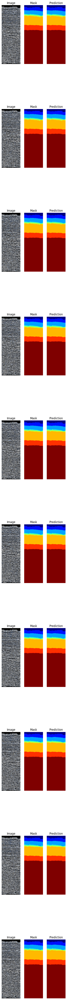

In [ ]:
fig, ax = plt.subplots(10, 3, figsize=(5, 80))
for i in range(batch_size):
    img = np.transpose(np.array(UNet_imgs[20][i, :, :, :].to('cpu')), (1, 2, 0))
    pred = np.array(UNet_preds[20][i, :, :])
    mask = np.array(UNet_masks[20][i, :, :].to('cpu'))

    ax[i, 0].set_title('Image')
    ax[i, 1].set_title('Mask')
    ax[i, 2].set_title('Prediction')

    ax[i][0].axis("off")
    ax[i][1].axis("off")
    ax[i][2].axis("off")

    ax[i][0].imshow(img, cmap='gray')
    ax[i][1].imshow(mask, cmap='jet')
    ax[i][2].imshow(pred, cmap='jet')

#Exp #2. UNet + Hypercolumns.

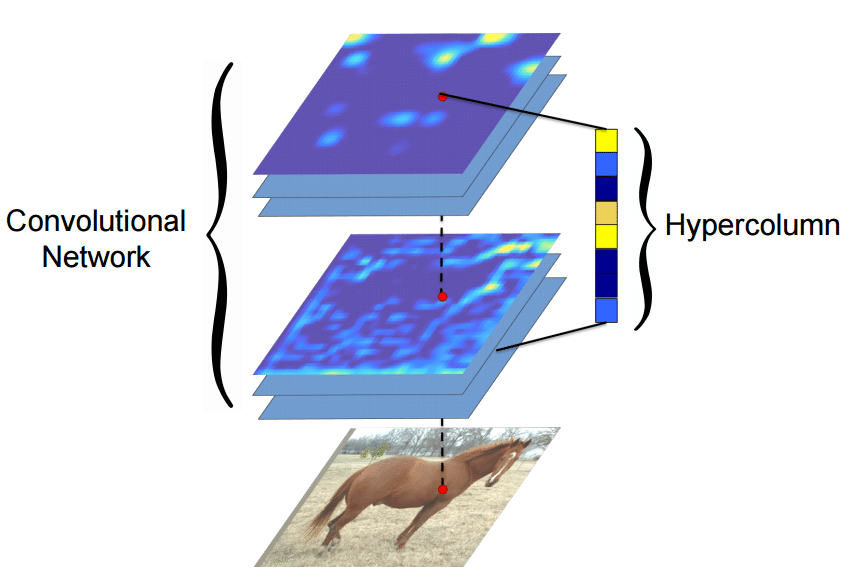

Более подробно про гиперколонки можно почитать [здесь](https://arxiv.org/abs/1411.5752). Идея состоит в том, чтобы заапсемплить все выходы с декодера до одного размера, конкатенировать их и только после этого предсказывать маски.

In [ ]:
class UNetwHC(nn.Module):
    def __init__(self, out_channels=8, features=[64, 128, 256, 512]):
        super(UNetwHC, self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))
        self.conv1 = encoding_block(3, features[0])
        self.conv2 = encoding_block(features[0], features[1])
        self.conv3 = encoding_block(features[1], features[2])
        self.conv4 = encoding_block(features[2], features[3])
        self.conv5 = encoding_block(features[3]*2, features[3])
        self.conv6 = encoding_block(features[3], features[2])
        self.conv7 = encoding_block(features[2], features[1])
        self.conv8 = encoding_block(features[1], features[0])

        self.bottleneck = encoding_block(features[3], features[3]*2)

        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)
        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)
        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)
        self.conv33 = nn.Sequential(nn.Conv2d(features[1], features[0], kernel_size=3, dilation=1, padding=1, bias=False),
                                    nn.BatchNorm2d(features[0]),
                                    nn.LeakyReLU(inplace=True))
        self.conv333 = nn.Sequential(nn.Conv2d(features[0], features[1], kernel_size=3, dilation=1, padding=1, bias=False),
                                     nn.BatchNorm2d(features[1]),
                                     nn.LeakyReLU(inplace=True))

        self.final_layer = nn.Sequential(nn.Conv2d(features[1]*8, features[0], kernel_size=3, padding=1),
                                         nn.LeakyReLU(inplace=True),
                                         nn.Conv2d(features[0], out_channels, kernel_size=1, bias=False))
        # self.active = nn.Softmax(dim=1)

    def forward(self, x):
        skip_connections = []
        #1
        e1 = self.conv1(x)
        skip_connections.append(e1)
        e1 = self.pool(e1)   # features x height x width = 64 x 224 x 72
        #2
        e2 = self.conv2(e1)
        skip_connections.append(e2)
        e2 = self.pool(e2)   # 128 x 112 x 36
        #3
        e3 = self.conv3(e2)
        skip_connections.append(e3)
        e3 = self.pool(e3)   # 256 x 56 x 18
        #4
        e4 = self.conv4(e3)
        skip_connections.append(e4)
        e4 = self.pool(e4)   # 512 x 28 x 9
        #Bottleneck
        center = self.bottleneck(e4)   # 1 024 x 28 x 9
        skip_connections = skip_connections[::-1]
        #4
        d4 = self.tconv1(center)   # 512 x 56 x 18
        d4 = torch.cat((skip_connections[0], d4), dim=1)
        d4 = self.conv5(d4)
        #3
        d3 = self.tconv2(d4)   # 256 x 112 x 36
        d3 = torch.cat((skip_connections[1], d3), dim=1)
        d3 = self.conv6(d3)
        #2
        d2 = self.tconv3(d3)   # 128 x 224 x 72
        d2 = torch.cat((skip_connections[2], d2), dim=1)
        d2 = self.conv7(d2)
        #1
        d1 = F.upsample(input=d2, scale_factor=2, mode='bilinear', align_corners=True)   # 128 x 448 x 144
        d1 = self.conv33(d1)
        d1 = self.conv333(d1)
        #Hypercolumns
        x = torch.cat((d1,
                       F.upsample(d2, scale_factor=2, mode='bilinear', align_corners=True),
                       F.upsample(d3, scale_factor=4, mode='bilinear', align_corners=True),
                       F.upsample(d4, scale_factor=8, mode='bilinear', align_corners=True)), 1) # 256 x 448 x 144
        #Final
        x = self.final_layer(x)
        # x = self.active(out)

        return x

In [ ]:
HC_BM_WEIGHTS = '/content/gdrive/MyDrive/Seg_Penobscot/HC_best_model_weights'
os.makedirs(HC_BM_WEIGHTS, exist_ok=True)

In [ ]:
model_HC = UNetwHC().to(DEVICE)
torch.cuda.empty_cache()
from torchsummary import summary
summary(model_HC, (3, 448, 144))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 448, 144]           1,728
       BatchNorm2d-2         [-1, 64, 448, 144]             128
         LeakyReLU-3         [-1, 64, 448, 144]               0
            Conv2d-4         [-1, 64, 448, 144]          36,864
       BatchNorm2d-5         [-1, 64, 448, 144]             128
         LeakyReLU-6         [-1, 64, 448, 144]               0
            Conv2d-7         [-1, 64, 448, 144]          36,864
       BatchNorm2d-8         [-1, 64, 448, 144]             128
         LeakyReLU-9         [-1, 64, 448, 144]               0
   encoding_block-10         [-1, 64, 448, 144]               0
        MaxPool2d-11          [-1, 64, 224, 72]               0
           Conv2d-12         [-1, 128, 224, 72]          73,728
      BatchNorm2d-13         [-1, 128, 224, 72]             256
        LeakyReLU-14         [-1, 128, 

In [ ]:
seed_torch(seed)
optimizer = optim.AdamW(model_HC.parameters(), lr = 3e-4, weight_decay=1e-1, amsgrad=True, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=7.5e-5)
epochs = 1
losses = []
score = []
pbar = trange(epochs, desc='Epoch:')
for epoch in pbar:
    l = 0.0
    s = 0.0
    model_HC.train()
    for batch in aug_train_loader_55:
        X_batch, masks, Y_batch = batch['image'].to(DEVICE), batch['mask'].to(DEVICE), batch['label'].to(DEVICE)
        logits = model_HC(X_batch)
        loss = comb_loss(logits.to(DEVICE), Y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        l += loss
        s += mIoU(logits, masks)
    optimizer.step()
    loss = l / len(aug_train_loader_55)
    losses.append(loss)
    sc = s / len(aug_train_loader_55)
    score.append(sc)
print(l, loss, losses, score)

Epoch::   0%|          | 0/1 [00:00<?, ?it/s]

tensor(10.9854, device='cuda:0', grad_fn=<AddBackward0>) tensor(0.3329, device='cuda:0', grad_fn=<DivBackward0>) [tensor(0.3329, device='cuda:0', grad_fn=<DivBackward0>)] [0.3318644118886972]


---------- Epoch 56/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.002379114065799072
Train mIoU = 0.9918


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.004791580055924979
Val mIoU = 0.9825
Time: 3735.17484664917
---------- Epoch 57/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.002608719197186557
Train mIoU = 0.9908


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.00515758330849084
Val mIoU = 0.9817
Time: 3801.2205832004547
---------- Epoch 58/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0028816009236668997
Train mIoU = 0.9897


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.004925927189602094
Val mIoU = 0.9821
Time: 3867.4055049419403
---------- Epoch 59/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0033202540538640637
Train mIoU = 0.9883


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.005643660498952324
Val mIoU = 0.9789
Time: 3933.617283344269
---------- Epoch 60/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0030137316789478064
Train mIoU = 0.9889


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.005446309223771095
Val mIoU = 0.9809
Time: 3999.7522761821747


<ipython-input-15-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


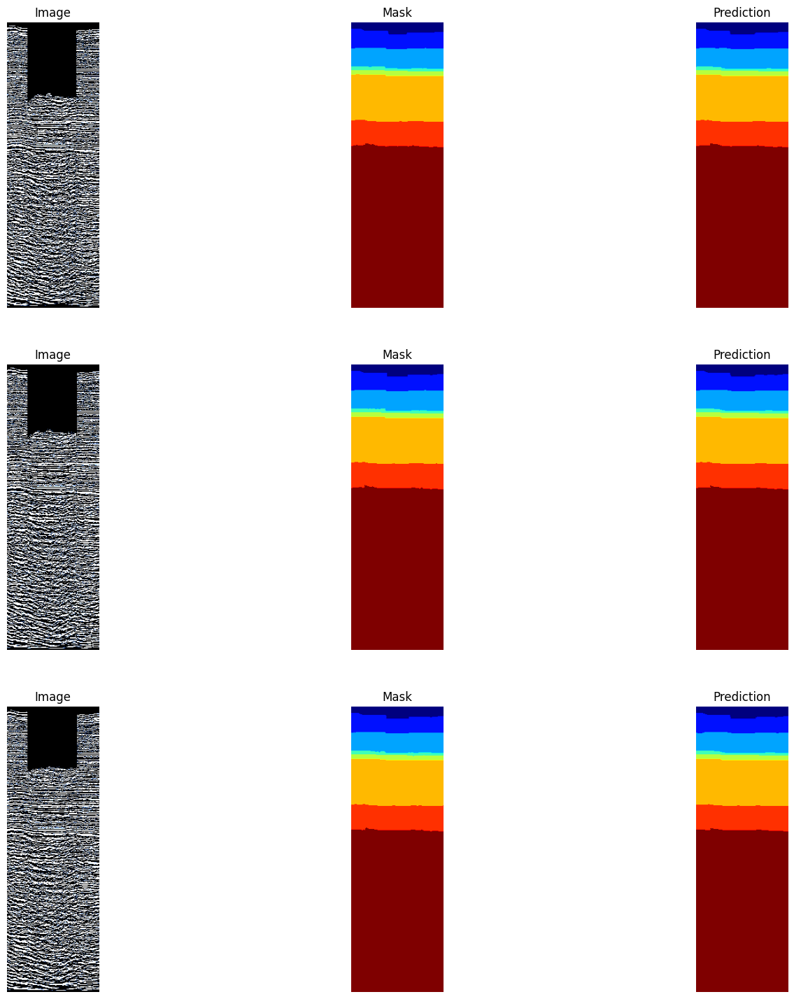

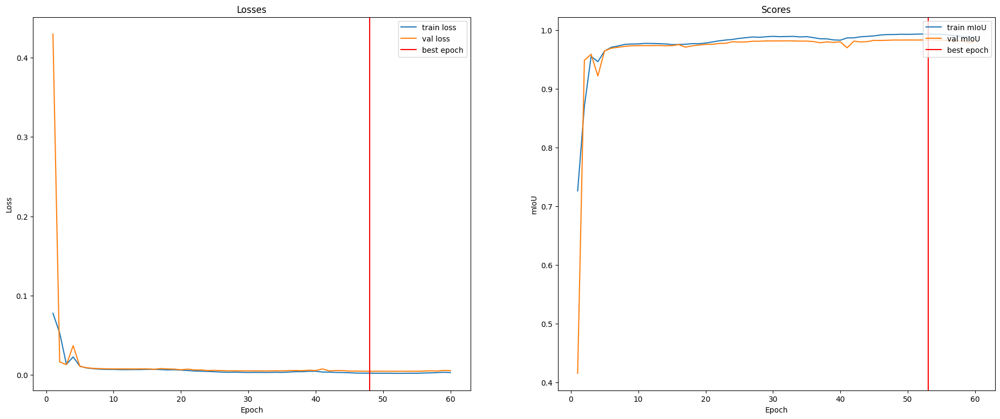

In [ ]:
epochs = 60
seed_torch(seed)
optimizer = optim.AdamW(model_HC.parameters(), lr = 3e-4, weight_decay=1e-1, amsgrad=True, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_2 = train(
    model_HC, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, HC_BM_WEIGHTS
)

In [ ]:
best_model = UNetwHC()
best_model.load_state_dict(torch.load(os.path.join(HC_BM_WEIGHTS, 'Best_model_53.pth')))
HC_test_loss, HC_test_mIoU, HC_imgs, HC_masks, HC_preds = evaluate(best_model.to(DEVICE), test_loader_55)
HC_test_loss, HC_test_mIoU

Test loss = 0.004020801484130505
Test mIoU = 0.9852835273535129


(0.004020801484130505, 0.9852835273535129)

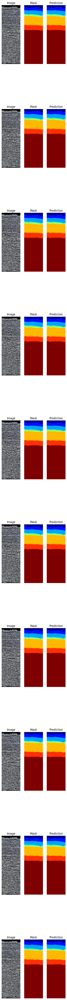

In [ ]:
fig, ax = plt.subplots(10, 3, figsize=(5, 80))
for i in range(batch_size):
    img = np.transpose(np.array(HC_imgs[20][i, :, :, :].to('cpu')), (1, 2, 0))
    mask = np.array(HC_masks[20][i, :, :].to('cpu'))
    pred = np.array(HC_preds[20][i, :, :])

    ax[i, 0].set_title('Image')
    ax[i, 1].set_title('Mask')
    ax[i, 2].set_title('Prediction')

    ax[i][0].axis("off")
    ax[i][1].axis("off")
    ax[i][2].axis("off")

    ax[i][0].imshow(img, cmap='gray')
    ax[i][1].imshow(mask, cmap='jet')
    ax[i][2].imshow(pred, cmap='jet')

#Exp #3. UNet + Hypercolumns + Spatial and Channel 'Squeeze & Excitation' blocks.

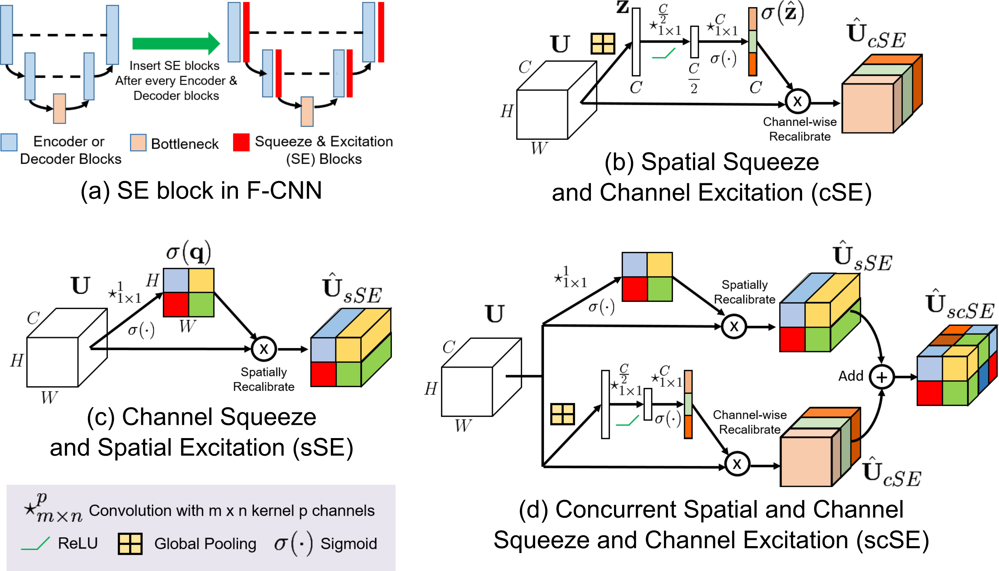

Более подробно про Spatial and Channel 'Squeeze & Excitation' блок можно почитать [здесь](https://arxiv.org/abs/1803.02579). Идея состоит в том, чтобы взять выход со свёрточного блока, сделать глобал пуллинг, после чего получаем вектор 1 x количество каналов, затем проводим его через несколько полносвязных слоёв, после чего поэлементно умножаем его на исходный вход. В итоге получаем перевзвешенный feature-map за счёт перевзвешивания каналов. Аналогичная операция проводится с пространственной информацией, для чего сначала применяется свёртка 1 x 1, затем умножаем её на исходный feature-map и получаем перевзвешивание простаранственной информации. В конце два этих блока складываются. Такой блок будем применять как в энкодере, так и в декодере.

In [ ]:
class SpatialAttention2d(nn.Module):
    def __init__(self, channel):
        super(SpatialAttention2d, self).__init__()
        self.squeeze = nn.Conv2d(channel, 1, kernel_size=1, bias=False)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        z = self.squeeze(x)
        z = self.softmax(z)
        return x * z

In [ ]:
class GAB(nn.Module):
    def __init__(self, input_dim, reduction=4):
        super(GAB, self).__init__()
        self.global_avgpool = nn.AdaptiveAvgPool2d(1)
        self.conv1 = nn.Conv2d(input_dim, input_dim // reduction, kernel_size=1, stride=1)
        self.conv2 = nn.Conv2d(input_dim // reduction, input_dim, kernel_size=1, stride=1)
        self.lrelu = nn.LeakyReLU(inplace=True)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        z = self.global_avgpool(x)
        z = self.lrelu(self.conv1(z))
        z = self.softmax(self.conv2(z))
        return x * z

In [ ]:
class SCse(nn.Module):
    def __init__(self, dim):
        super(SCse, self).__init__()
        self.satt = SpatialAttention2d(dim)
        self.catt = GAB(dim)

    def forward(self, x):
        return self.satt(x) + self.catt(x)

In [ ]:
class encoding_block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(encoding_block, self).__init__()
        model = []
        model.append(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.LeakyReLU(inplace=True))
        model.append(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.LeakyReLU(inplace=True))
        self.conv = nn.Sequential(*model)
    def forward(self, x):
        return self.conv(x)

In [ ]:
class UNetwSCse(nn.Module):
    def __init__(self, out_channels=8, features=[64, 128, 256, 512]):
        super(UNetwSCse, self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))
        self.conv1 = nn.Sequential(encoding_block(3, features[0]),
                                   SCse(features[0]))
        self.conv2 = nn.Sequential(encoding_block(features[0], features[1]),
                                   SCse(features[1]))
        self.conv3 = nn.Sequential(encoding_block(features[1], features[2]),
                                   SCse(features[2]))
        self.conv4 = nn.Sequential(encoding_block(features[2], features[3]),
                                   SCse(features[3]))
        self.conv5 = nn.Sequential(encoding_block(features[3]*2, features[3]),
                                   SCse(features[3]))
        self.conv6 = nn.Sequential(encoding_block(features[3], features[2]),
                                   SCse(features[2]))
        self.conv7 = nn.Sequential(encoding_block(features[2], features[1]),
                                   SCse(features[1]))

        self.bottleneck = encoding_block(features[3], features[3]*2)

        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)
        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)
        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)
        self.conv33 = nn.Sequential(nn.Conv2d(features[1], features[0], kernel_size=3, dilation=1, padding=1, bias=False),
                                    nn.BatchNorm2d(features[0]),
                                    nn.LeakyReLU(inplace=True))
        self.conv333 = nn.Sequential(nn.Conv2d(features[0], features[1], kernel_size=3, dilation=1, padding=1, bias=False),
                                     nn.BatchNorm2d(features[1]),
                                     nn.LeakyReLU(inplace=True))
        self.s_att = SpatialAttention2d(features[1])
        self.c_att = GAB(features[1], 16)

        self.final_layer = nn.Sequential(nn.Conv2d(features[1]*8, features[0], kernel_size=3, padding=1),
                                         nn.LeakyReLU(inplace=True),
                                         nn.Conv2d(features[0], out_channels, kernel_size=1, bias=False))
        # self.active = nn.Softmax(dim=1)

    def forward(self, x):
        skip_connections = []
        #1
        e1 = self.conv1(x)
        skip_connections.append(e1)
        e1 = self.pool(e1)   # features x height x width = 64 x 224 x 72
        #2
        e2 = self.conv2(e1)
        skip_connections.append(e2)
        e2 = self.pool(e2)   # 128 x 112 x 36
        #3
        e3 = self.conv3(e2)
        skip_connections.append(e3)
        e3 = self.pool(e3)   # 256 x 56 x 18
        #4
        e4 = self.conv4(e3)
        skip_connections.append(e4)
        e4 = self.pool(e4)   # 512 x 28 x 9
        #Bottleneck
        center = self.bottleneck(e4)   # 1 024 x 28 x 9
        skip_connections = skip_connections[::-1]
        #4
        d4 = self.tconv1(center)   # 512 x 56 x 18
        d4 = torch.cat((skip_connections[0], d4), dim=1)
        d4 = self.conv5(d4)
        #3
        d3 = self.tconv2(d4)   # 256 x 112 x 36
        d3 = torch.cat((skip_connections[1], d3), dim=1)
        d3 = self.conv6(d3)
        #2
        d2 = self.tconv3(d3)   # 128 x 224 x 72
        d2 = torch.cat((skip_connections[2], d2), dim=1)
        d2 = self.conv7(d2)
        #1
        d1 = F.upsample(input=d2, scale_factor=2, mode='bilinear', align_corners=True)   # 128 x 448 x 144
        d1 = self.conv33(d1)
        d1 = self.conv333(d1)
        d1 = self.s_att(d1) + self.c_att(d1)
        #Hypercolumns
        x = torch.cat((d1,
                       F.upsample(d2, scale_factor=2, mode='bilinear', align_corners=True),
                       F.upsample(d3, scale_factor=4, mode='bilinear', align_corners=True),
                       F.upsample(d4, scale_factor=8, mode='bilinear', align_corners=True)), 1) # 1 024 x 448 x 144
        #Final
        logit = self.final_layer(x)
        # x = self.active(logit)

        return logit

In [ ]:
model_SCse = UNetwSCse().to(DEVICE)
torch.cuda.empty_cache()
from torchsummary import summary
summary(model_SCse, (3, 448, 144))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 448, 144]           1,728
       BatchNorm2d-2         [-1, 64, 448, 144]             128
         LeakyReLU-3         [-1, 64, 448, 144]               0
            Conv2d-4         [-1, 64, 448, 144]          36,864
       BatchNorm2d-5         [-1, 64, 448, 144]             128
         LeakyReLU-6         [-1, 64, 448, 144]               0
    encoding_block-7         [-1, 64, 448, 144]               0
            Conv2d-8          [-1, 1, 448, 144]              64
           Softmax-9          [-1, 1, 448, 144]               0
SpatialAttention2d-10         [-1, 64, 448, 144]               0
AdaptiveAvgPool2d-11             [-1, 64, 1, 1]               0
           Conv2d-12             [-1, 16, 1, 1]           1,040
        LeakyReLU-13             [-1, 16, 1, 1]               0
           Conv2d-14             [-1, 

In [ ]:
SCse_BM_WEIGHTS = '/content/gdrive/MyDrive/Seg_Penobscot/SCse_best_model_weights'
os.makedirs(SCse_BM_WEIGHTS, exist_ok=True)

In [ ]:
seed_torch(seed)
optimizer = optim.AdamW(model_SCse.parameters(), lr = 3e-4, weight_decay=1e-1, amsgrad=True, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
epochs = 1

losses = []
score = []
pbar = trange(epochs, desc='Epoch:')
for epoch in pbar:
    l = 0.0
    s = 0.0
    model_SCse.train()
    for batch in aug_train_loader_55:
        X_batch, masks, Y_batch = batch['image'].to(DEVICE), batch['mask'].to(DEVICE), batch['label'].to(DEVICE)
        logits = model_SCse(X_batch)
        loss = comb_loss(logits.to(DEVICE), Y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        l += loss
        s += mIoU(logits, masks)
    optimizer.step()
    loss = l / len(aug_train_loader_55)
    losses.append(loss)
    sc = s / len(aug_train_loader_55)
    score.append(sc)
print(l, loss, losses, score)

Epoch::   0%|          | 0/1 [00:00<?, ?it/s]

tensor(9.3532, device='cuda:0', grad_fn=<AddBackward0>) tensor(0.2834, device='cuda:0', grad_fn=<DivBackward0>) [tensor(0.2834, device='cuda:0', grad_fn=<DivBackward0>)] [0.4293948466090755]


---------- Epoch 56/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0016934264585319343
Train mIoU = 0.9947


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.0040755790700627995
Val mIoU = 0.9848
Time: 3435.3645420074463
---------- Epoch 57/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.0020091922699727797
Train mIoU = 0.9930


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.0042136775075711985
Val mIoU = 0.9839
Time: 3496.501095533371
---------- Epoch 58/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.2432730528702395
Train mIoU = 0.5656


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.3501727201721885
Val mIoU = 0.3431
Time: 3556.928871154785
---------- Epoch 59/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.11134960683006229
Train mIoU = 0.6360


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.08205525441603227
Val mIoU = 0.6684
Time: 3617.6446866989136
---------- Epoch 60/60 ----------


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss = 0.04914163673917452
Train mIoU = 0.8170


  0%|          | 0/11 [00:00<?, ?it/s]

Val loss = 0.03231524574485692
Val mIoU = 0.8817
Time: 3678.263633966446


<ipython-input-13-a176a98e29ea>:76: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


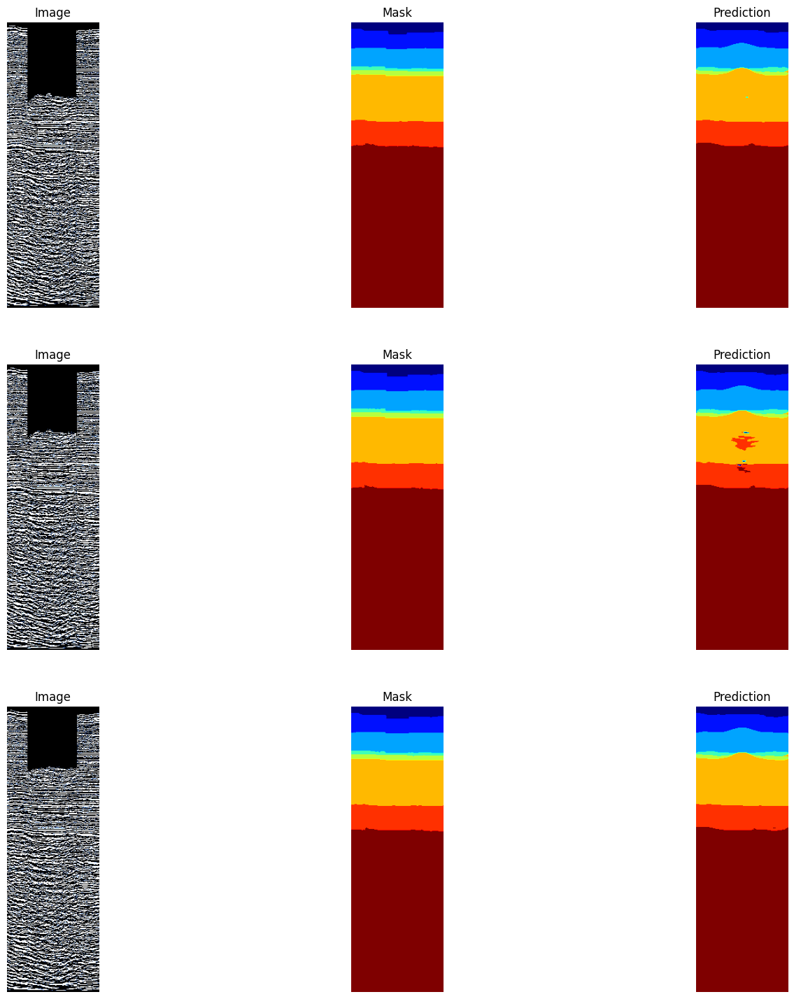

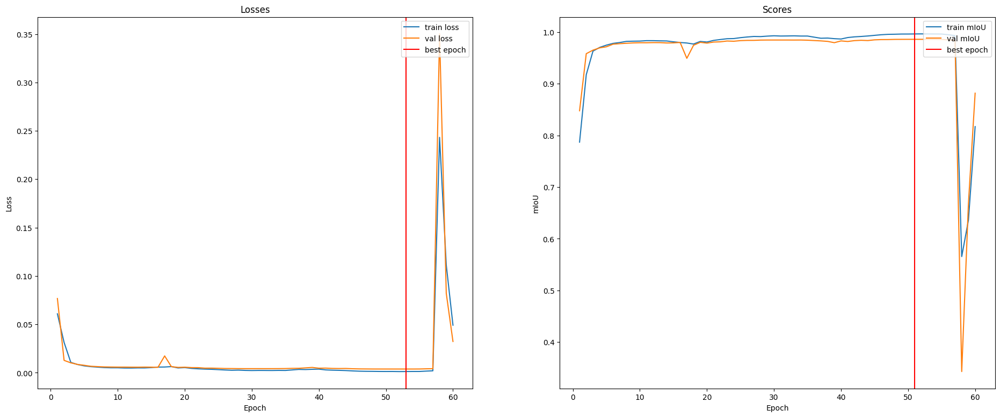

In [ ]:
epochs = 60
seed_torch(seed)
optimizer = optim.AdamW(model_SCse.parameters(), lr = 3e-4, weight_decay=1e-1, amsgrad=True, betas=(0.5, 0.999))
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

CL_best_model_weights, train_CL_losses, val_CL_losses, train_CL_scores, val_CL_scores, time_3 = train(
    model_SCse, aug_train_loader_55, val_loader_55, optimizer, scheduler, epochs, SCse_BM_WEIGHTS
)

In [ ]:
best_model = UNetwSCse()
best_model.load_state_dict(torch.load(os.path.join(SCse_BM_WEIGHTS, 'Best_model_51.pth')))
SCse_test_loss, SCse_test_mIoU, SCse_imgs, SCse_masks, SCse_preds = evaluate(best_model.to(DEVICE), test_loader_55)
SCse_test_loss, SCse_test_mIoU

Test loss = 0.0035269471089832668
Test mIoU = 0.9872089668752165


(0.0035269471089832668, 0.9872089668752165)

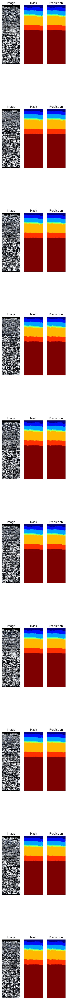

In [ ]:
fig, ax = plt.subplots(10, 3, figsize=(5, 80))
cc = []
for i in range(batch_size):
    img = np.transpose(np.array(SCse_imgs[20][i, :, :, :].to('cpu')), (1, 2, 0))
    pred = np.array(SCse_preds[20][i, :, :])
    mask = np.array(SCse_masks[20][i, :, :].to('cpu'))

    ax[i, 0].set_title('Image')
    ax[i, 1].set_title('Mask')
    ax[i, 2].set_title('Prediction')

    ax[i][0].axis("off")
    ax[i][1].axis("off")
    ax[i][2].axis("off")

    ax[i][0].imshow(img, cmap='gray')
    ax[i][1].imshow(mask, cmap='jet')
    ax[i][2].imshow(pred, cmap='jet')

In [ ]:
training_time = [time_1, time_2, time_3]
for i in range(len(training_time)):
    training_time[i] = str(int(training_time[i] // 3600 % 24)) + ' h : ' + str(int(training_time[i] % 3600 // 60 // 10)) + str(int(training_time[i] % 3600 // 60 % 10)) + ' min : ' + str(int(training_time[i] % 60 // 10)) + str(int(training_time[i] % 60 % 10)) + ' sec'
print(training_time[2])

1 h : 01 min : 20 sec


In [ ]:
test_mIoU = [UNet_test_mIoU, HC_test_mIoU, SCse_test_mIoU]
for i in range(len(test_mIoU)):
    test_mIoU[i] = f"{(test_mIoU[i]):.4f}"
test_mIoU[0]

'0.9797'

In [ ]:
data = np.array([training_time[0], test_mIoU[0], training_time[1], test_mIoU[1],
                 training_time[2], test_mIoU[2]]).reshape(3, 2)

rows = ["Exp #1. Vanilla UNet (conv blocks with 3 conv layers)",
        "Exp #2. UNet with Hypercolumns (conv blocks with 3 conv layers)",
        "Exp #3. UNet with Hypercolumns and Spatial and Channel 'Squeeze & Excitation' (conv blocks with 2 conv layers)"]
cols = ["training time", "test mIoU"]
df = pd.DataFrame(data=data, index=rows, columns=cols)
df

,training time,test mIoU
Exp #1. Vanilla UNet (conv blocks with 3 conv layers),0 h : 39 min : 07 sec,0.9797
Exp #2. UNet with Hypercolumns (conv blocks with 3 conv layers),1 h : 06 min : 41 sec,0.9853
Exp #3. UNet with Hypercolumns and Spatial and Channel 'Squeeze & Excitation' (conv blocks with 2 conv layers),1 h : 01 min : 20 sec,0.9872


#Выводы
Усложнение архитектуры демонстрирует более высокие показатели по метрике и характеризуется большей "чистотой" масок. Наилучший результат продемонстрирован в Exp #3 с добавлением в стандартную архитектуру UNet гиперколонок и Spatial and Channel ‘Squeeze & Excitation’ блока. Присутствующие на предсказаниях пятна очень небольшие по размерам и в большинстве своём достаточно узко локализованы на плоскости изображения.

В некоторых случаях требуются корректировки отдельных участков горизонтов, однако можно обойтись и без корректировок, т.к. с внесением корректировок в отдельные участки горизонтов общая ситуация не изменится. На предсказаниях горизонты более сглажены, чем на целевых масках и, по сути, это те единственные различия предсказаний и целевых масок. Более сглаженные горизонты на самом деле ближе к действительности и скорее всего данные участки не имеет смысла исправлять.



Время обучения более сложных моделей так же возрастает, однако оно того стоит, т.к. с практической точки зрения предсказания более сложных моделей почти не нуждаются в корректировках, за исключением масок с лишними пятнами, но их не так много. Да, уже сейчас возможна автоматическая корреляция (не нейросетевыми методами), но на участках с осложнённой волновой картиной (там, где невоозможна фазовая корреляция полезных волн) автокорреляция либо приостанавливается, либо предлагает некачественные результаты. Т.е. так или иначе требуются корректировки со стороны интерпретатора. Нейросетевой подход к корреляции горизонтов на сейсмических изображениях является наиболее оптимальным и эффективным, т.к. позволяет хотя бы частично отказаться от ручной корреляции, которая занимает очень много времени.